<a href="https://colab.research.google.com/github/ZalakBPatel/IBM/blob/main/Zalak_Patel_IBM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#IMPORTING NECESSARY LIBRARIES
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
!pip install tensorflow

#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout

#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

In [ ]:
# mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# importing the dataset
Fire_Dataset_Path = Path("/content/drive/MyDrive/IBM/fire_dataset")

In [ ]:
# path processing
PNG_Path = list(Fire_Dataset_Path.glob(r"*/*.png"))

In [ ]:
# Label Processing
PNG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],PNG_Path))
print("FIRE: ", PNG_Labels.count("fire_images"))
print("NO_FIRE: ", PNG_Labels.count("non_fire_images"))

FIRE:  755
NO_FIRE:  243


In [ ]:
# TRANSFORMATION TO SERIES STRUCTURE
PNG_Path_Series = pd.Series(PNG_Path,name="PNG").astype(str)
PNG_Labels_Series = pd.Series(PNG_Labels,name="CATEGORY")

In [ ]:
print(PNG_Path_Series)

0      /content/drive/MyDrive/IBM/fire_dataset/fire_i...
1      /content/drive/MyDrive/IBM/fire_dataset/fire_i...
2      /content/drive/MyDrive/IBM/fire_dataset/fire_i...
3      /content/drive/MyDrive/IBM/fire_dataset/fire_i...
4      /content/drive/MyDrive/IBM/fire_dataset/fire_i...
                             ...                        
993    /content/drive/MyDrive/IBM/fire_dataset/non_fi...
994    /content/drive/MyDrive/IBM/fire_dataset/non_fi...
995    /content/drive/MyDrive/IBM/fire_dataset/non_fi...
996    /content/drive/MyDrive/IBM/fire_dataset/non_fi...
997    /content/drive/MyDrive/IBM/fire_dataset/non_fi...
Name: PNG, Length: 998, dtype: object


In [ ]:
print(PNG_Labels_Series)

0          fire_images
1          fire_images
2          fire_images
3          fire_images
4          fire_images
            ...       
993    non_fire_images
994    non_fire_images
995    non_fire_images
996    non_fire_images
997    non_fire_images
Name: CATEGORY, Length: 998, dtype: object


In [ ]:
PNG_Labels_Series.replace({"non_fire_images":"NO_FIRE","fire_images":"FIRE"},inplace=True)
print(PNG_Labels_Series)

0         FIRE
1         FIRE
2         FIRE
3         FIRE
4         FIRE
        ...   
993    NO_FIRE
994    NO_FIRE
995    NO_FIRE
996    NO_FIRE
997    NO_FIRE
Name: CATEGORY, Length: 998, dtype: object


In [ ]:
# TRANSFORMATION TO DATAFRAME STRUCTURE

Main_Train_Data = pd.concat([PNG_Path_Series,PNG_Labels_Series],axis=1)
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
1    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
2    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
3    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
4    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
..                                                 ...      ...
992  /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
993  /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
994  /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
995  /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
996  /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE

[997 rows x 2 columns]


In [ ]:
# SHUFFLING
Main_Train_Data = Main_Train_Data.sample(frac=1).reset_index(drop=True)
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
1    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
2    /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
3    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
4    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
..                                                 ...      ...
992  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
993  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
994  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
995  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
996  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE

[997 rows x 2 columns]


In [ ]:
# print specific rows from the Main_Train_Data
print(Main_Train_Data["PNG"][2])
print(Main_Train_Data["CATEGORY"][2])
print(Main_Train_Data["PNG"][200])
print(Main_Train_Data["CATEGORY"][200])
print(Main_Train_Data["PNG"][45])
print(Main_Train_Data["CATEGORY"][45])
print(Main_Train_Data["PNG"][852])
print(Main_Train_Data["CATEGORY"][852])

/content/drive/MyDrive/IBM/fire_dataset/non_fire_images/non_fire.193.png
NO_FIRE
/content/drive/MyDrive/IBM/fire_dataset/fire_images/fire.370.png
FIRE
/content/drive/MyDrive/IBM/fire_dataset/fire_images/fire.97.png
FIRE
/content/drive/MyDrive/IBM/fire_dataset/fire_images/fire.587.png
FIRE


In [ ]:
# remove a specific entry from a DataFrame
remove_PNG = '../input/fire-dataset/fire_dataset/non_fire_images/non_fire.189.png'
Main_Train_Data = Main_Train_Data.loc[~(Main_Train_Data.loc[:,'PNG'] == remove_PNG),:]
print(Main_Train_Data.loc[Main_Train_Data.loc[:,'PNG'] == remove_PNG,:])

Empty DataFrame
Columns: [PNG, CATEGORY]
Index: []


In [ ]:
# We need to remove Non_Fire_189, this PNG is broken
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
1    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
2    /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
3    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
4    /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
..                                                 ...      ...
992  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
993  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
994  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
995  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
996  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE

[997 rows x 2 columns]


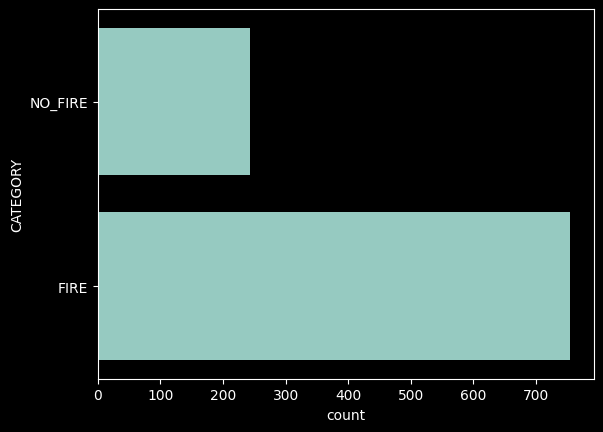

In [ ]:
# Data VISUALIZATION
plt.style.use("dark_background")
sns.countplot(Main_Train_Data["CATEGORY"])
plt.show()

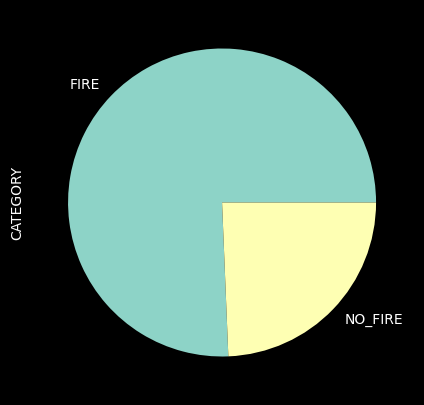

In [ ]:
Main_Train_Data['CATEGORY'].value_counts().plot.pie(figsize=(5,5))
plt.show()

Text(0.5, 1.0, 'NO_FIRE')

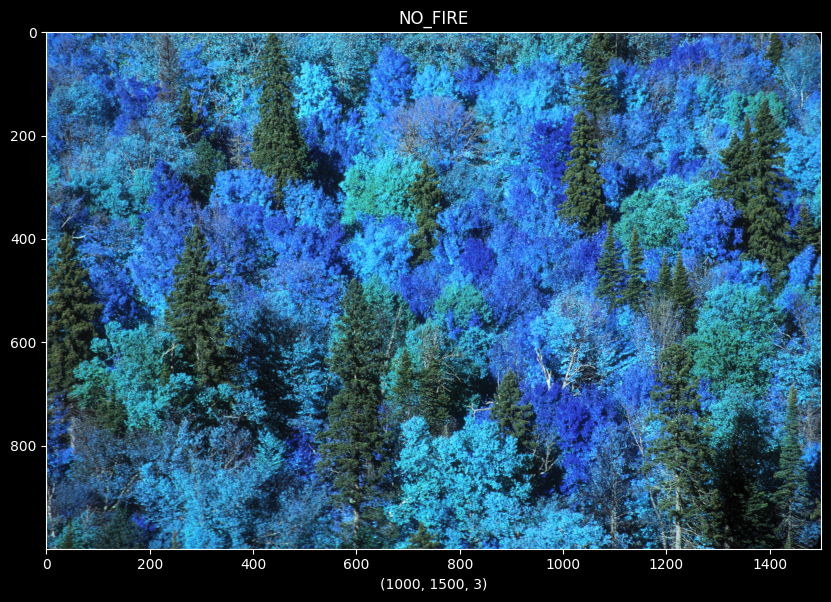

In [ ]:
# Displaying Image from Dataset
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][0])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][0])

Text(0.5, 1.0, 'FIRE')

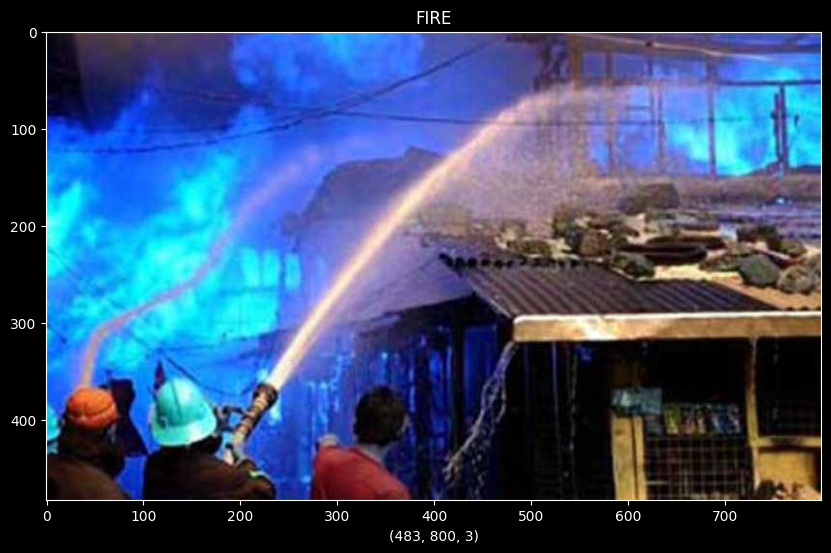

In [ ]:
# Displaying Image from Dataset
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][993])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][993])

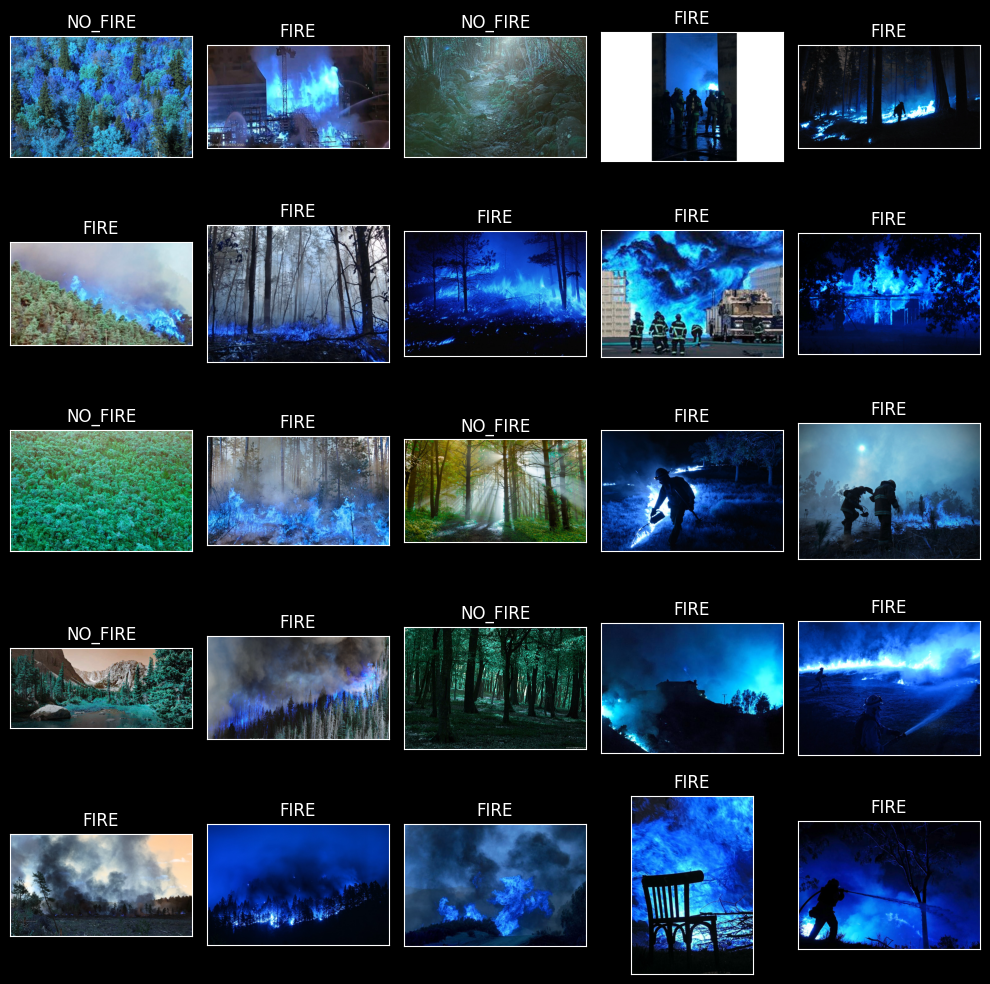

In [ ]:
# Displaying Training Images with Categories
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Main_Train_Data["PNG"][i]))
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

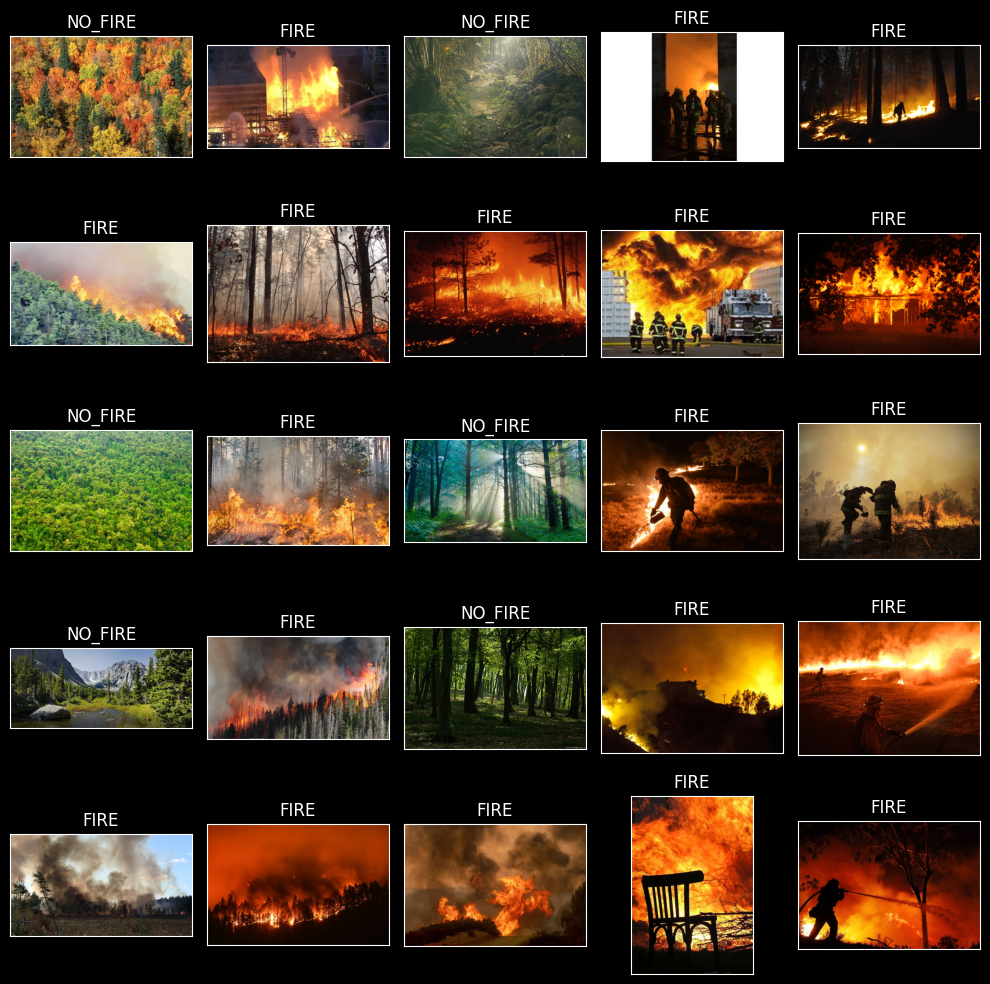

In [ ]:
# Grid Display of Images with Titles Using Matplotlib and OpenCV
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    x = cv2.imread(Main_Train_Data["PNG"][i])
    x = cv2.cvtColor(x,cv2.COLOR_RGB2BGR)
    ax.imshow(x)
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

In [ ]:
# DETERMINATION TRAIN AND TEST DATA
Train_Generator = ImageDataGenerator(rescale=1./255,
                                    shear_range=0.3,
                                    zoom_range=0.2,
                                    brightness_range=[0.2,0.9],
                                    rotation_range=30,
                                    horizontal_flip=True,
                                    vertical_flip=True,
                                    fill_mode="nearest",
                                    validation_split=0.1)

Test_Generator = ImageDataGenerator(rescale=1./255)

In [ ]:
# SPLITTING TRAIN AND TEST
Train_Data,Test_Data = train_test_split(Main_Train_Data,train_size=0.9,random_state=42,shuffle=True)
print("TRAIN SHAPE: ",Train_Data.shape)
print("TEST SHAPE: ",Test_Data.shape)

TRAIN SHAPE:  (898, 2)
TEST SHAPE:  (100, 2)


In [ ]:
print(Train_Data.head(-1))
print("----"*20)
print(Test_Data.head(-1))

                                                   PNG CATEGORY
599  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
432  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
221  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
972  /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
525  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
..                                                 ...      ...
71   /content/drive/MyDrive/IBM/fire_dataset/non_fi...  NO_FIRE
106  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
270  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
860  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE
435  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE

[897 rows x 2 columns]
--------------------------------------------------------------------------------
                                                   PNG CATEGORY
453  /content/drive/MyDrive/IBM/fire_dataset/fire_i...     FIRE

In [ ]:
print(Test_Data["CATEGORY"].value_counts())

FIRE       82
NO_FIRE    18
Name: CATEGORY, dtype: int64


In [ ]:
# Encoding Categorical Labels in Test Data Using LabelEncoder
encode = LabelEncoder()
For_Prediction_Class = encode.fit_transform(Test_Data["CATEGORY"])

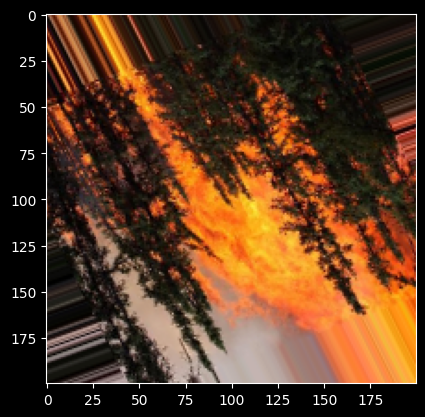

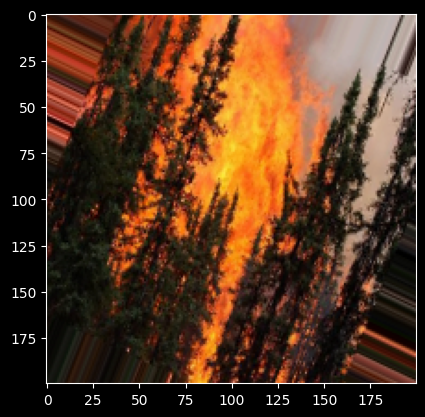

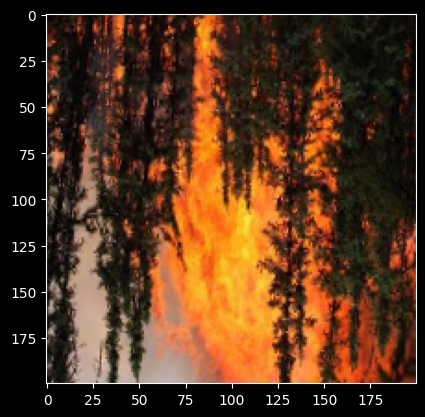

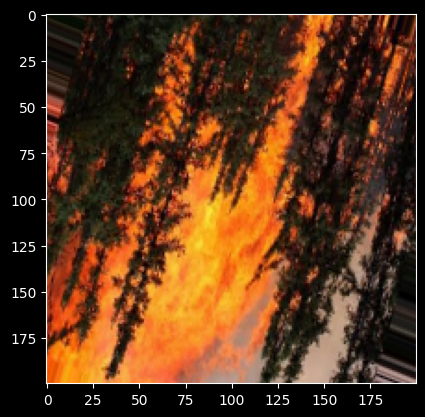

In [ ]:
# Image Augmentation and Display Using Keras's ImageDataGenerator
example_Image = Train_Data["PNG"][99]
Load_Image = image.load_img(example_Image,target_size=(200,200))
Array_Image = image.img_to_array(Load_Image)
Array_Image = Array_Image.reshape((1,) + Array_Image.shape)

i = 0
for batch in Train_Generator.flow(Array_Image,batch_size=1):
    plt.figure(i)
    IMG = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
plt.show()

In [ ]:
# Creating a Training Image Data Generator from DataFrame in Keras
Train_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="training")

# Creating a Validation Image Data Generator from DataFrame in Keras
Validation_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="validation")

# Creating a Testing Image Data Generator from DataFrame in Keras
Test_IMG_Set = Test_Generator.flow_from_dataframe(dataframe=Test_Data,
                                                 x_col="PNG",
                                                 y_col="CATEGORY",
                                                 color_mode="rgb",
                                                 class_mode="categorical",
                                                 batch_size=32)

Found 809 validated image filenames belonging to 2 classes.
Found 89 validated image filenames belonging to 2 classes.
Found 100 validated image filenames belonging to 2 classes.


In [ ]:
# Checking Shapes of Data and Label
for data_batch,label_batch in Train_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

for data_batch,label_batch in Validation_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

for data_batch,label_batch in Test_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)
DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)
DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [ ]:
# Analysis of Image Data Generators
print("TRAIN: ")
print(Train_IMG_Set.class_indices)
print(Train_IMG_Set.classes[0:5])
print(Train_IMG_Set.image_shape)
print("---"*20)
print("VALIDATION: ")
print(Validation_IMG_Set.class_indices)
print(Validation_IMG_Set.classes[0:5])
print(Validation_IMG_Set.image_shape)
print("---"*20)
print("TEST: ")
print(Test_IMG_Set.class_indices)
print(Test_IMG_Set.classes[0:5])
print(Test_IMG_Set.image_shape)

TRAIN: 
{'FIRE': 0, 'NO_FIRE': 1}
[1, 1, 1, 0, 1]
(256, 256, 3)
------------------------------------------------------------
VALIDATION: 
{'FIRE': 0, 'NO_FIRE': 1}
[0, 0, 0, 1, 0]
(256, 256, 3)
------------------------------------------------------------
TEST: 
{'FIRE': 0, 'NO_FIRE': 1}
[0, 1, 0, 1, 1]
(256, 256, 3)


In [ ]:
# Applying CNN Fully-Connected layer
Model = tf.keras.models.Sequential([
  # inputs
  tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
  tf.keras.layers.Flatten(input_shape=(256,)),
  # hiddens layers
  tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  # output layer
  tf.keras.layers.Dense(2,activation="softmax")
])

In [ ]:
Call_Back = tf.keras.callbacks.EarlyStopping(monitor="loss",patience=5,mode="min")

In [ ]:
Model.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])
ANN_Model = Model.fit(Train_IMG_Set,
                          validation_data=Validation_IMG_Set,
                          callbacks=Call_Back,
                      epochs=50)

Epoch 1/50
26/26 [==============================] - 66s 2s/step - loss: 0.4486 - accuracy: 0.7515 - val_loss: 0.3609 - val_accuracy: 0.7865
Epoch 2/50
26/26 [==============================] - 58s 2s/step - loss: 0.3479 - accuracy: 0.8331 - val_loss: 0.2935 - val_accuracy: 0.9101
Epoch 3/50
26/26 [==============================] - 54s 2s/step - loss: 0.2944 - accuracy: 0.8789 - val_loss: 0.2134 - val_accuracy: 0.9213
Epoch 4/50
26/26 [==============================] - 49s 2s/step - loss: 0.2315 - accuracy: 0.9147 - val_loss: 0.1745 - val_accuracy: 0.9438
Epoch 5/50
26/26 [==============================] - 50s 2s/step - loss: 0.2174 - accuracy: 0.9197 - val_loss: 0.1555 - val_accuracy: 0.9326
Epoch 6/50
26/26 [==============================] - 49s 2s/step - loss: 0.2173 - accuracy: 0.9172 - val_loss: 0.1451 - val_accuracy: 0.9438
Epoch 7/50
26/26 [==============================] - 50s 2s/step - loss: 0.2800 - accuracy: 0.8912 - val_loss: 0.1801 - val_accuracy: 0.9438
Epoch 8/50
26/26 [==

In [ ]:
# Summary
print(Model.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, None, None, None   0         
                             )                                   
                                                                 
 flatten_4 (Flatten)         (None, None)              0         
                                                                 
 dense_11 (Dense)            (None, 128)               25165952  
                                                                 
 dense_12 (Dense)            (None, 64)                8256      
                                                                 
 dropout_6 (Dropout)         (None, 64)                0         
                                                                 
 dense_13 (Dense)            (None, 2)                 130       
                                                      

In [ ]:
# Evaluating Model Performance on Test Data
Model_Result = Model.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Result[0])
print("ACCURACY:  " + "%.2f" % Model_Result[1])

4/4 [==============================] - 2s 401ms/step - loss: 0.0760 - accuracy: 0.9600
LOSS:  0.0760
ACCURACY:  0.96


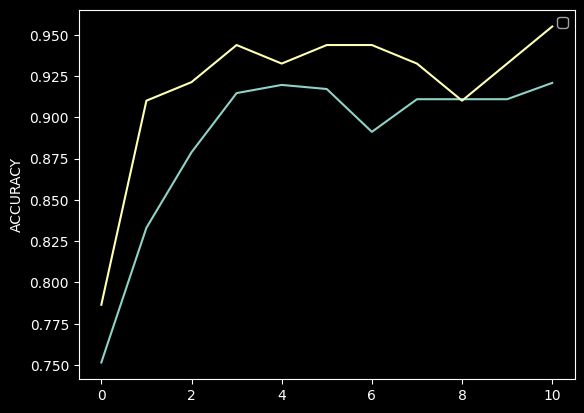

In [ ]:
# Training and Validation Accuracy Plot
plt.plot(ANN_Model.history["accuracy"])
plt.plot(ANN_Model.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

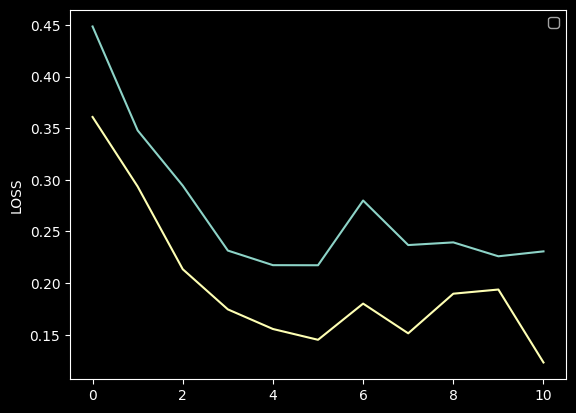

In [ ]:
# Training and Validation Loss Plot
plt.plot(ANN_Model.history["loss"])
plt.plot(ANN_Model.history["val_loss"])
plt.ylabel("LOSS")
plt.legend()
plt.show()

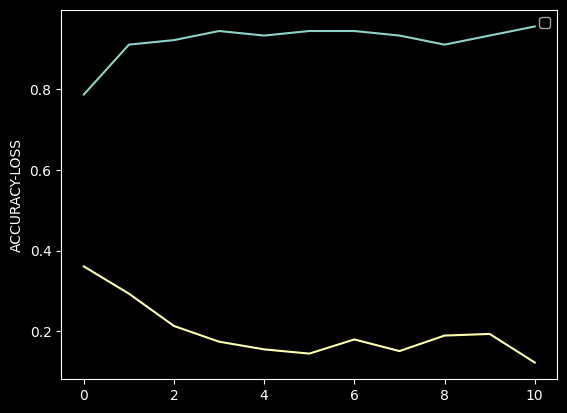

In [ ]:
# Validation Accuracy and Loss Plot
plt.plot(ANN_Model.history["val_accuracy"])
plt.plot(ANN_Model.history["val_loss"])
plt.ylabel("ACCURACY-LOSS")
plt.legend()
plt.show()

In [ ]:
# PREDICTION
Prediction = Model.predict(Test_IMG_Set)
Prediction = Prediction.argmax(axis=-1)
print(Prediction)

4/4 [==============================] - 2s 419ms/step
[0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 1 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]


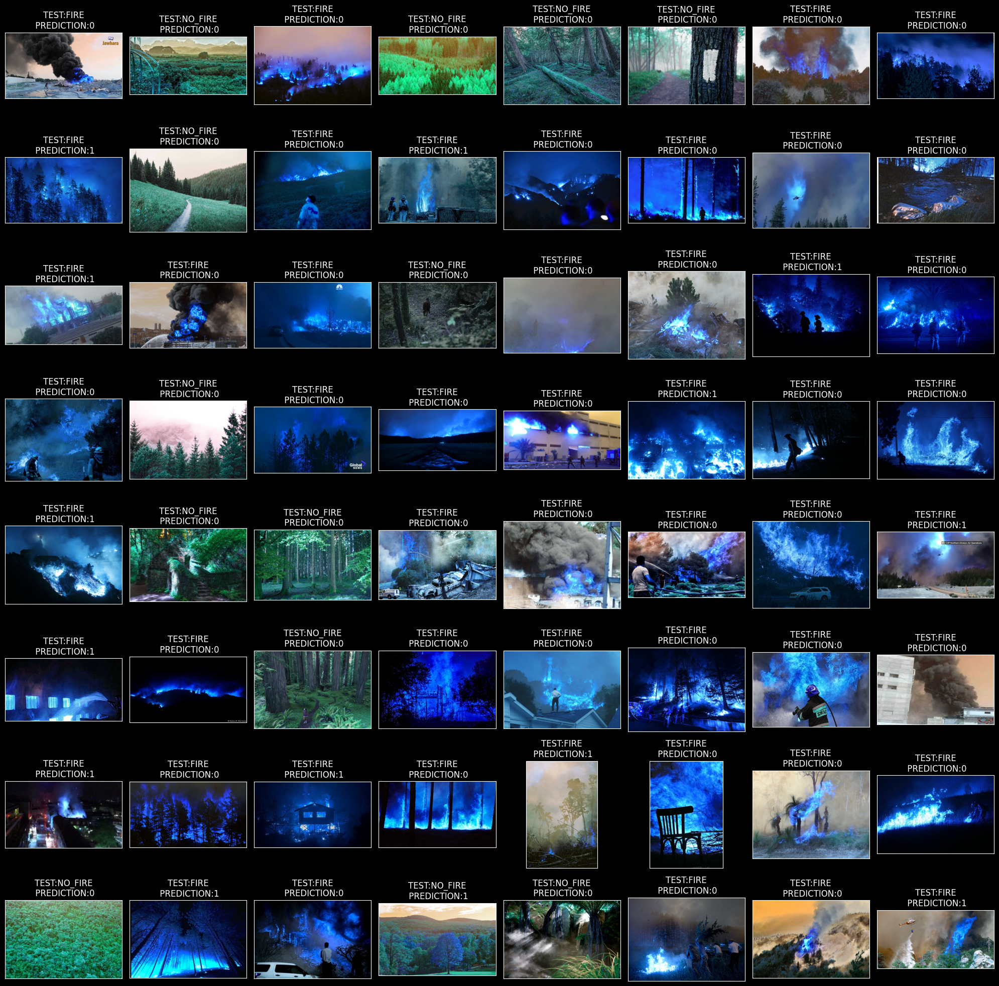

In [ ]:
# Visualization of Test Images with Predictions
fig, axes = plt.subplots(nrows=8,
                         ncols=8,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Test_Data["PNG"].iloc[i]))
    ax.set_title(f"TEST:{Test_Data.CATEGORY.iloc[i]}\n PREDICTION:{Prediction[i]}")
plt.tight_layout()
plt.show()

In [ ]:
# CLASSIFICATION & CONFUSION REPORT
print(confusion_matrix(For_Prediction_Class,Prediction_Class))

[[66 16]
 [14  4]]


In [ ]:
print(classification_report(For_Prediction_Class,Prediction_Class))

              precision    recall  f1-score   support

           0       0.82      0.80      0.81        82
           1       0.20      0.22      0.21        18

    accuracy                           0.70       100
   macro avg       0.51      0.51      0.51       100
weighted avg       0.71      0.70      0.71       100



1/1 [==============================] - 0s 434ms/step
[0]


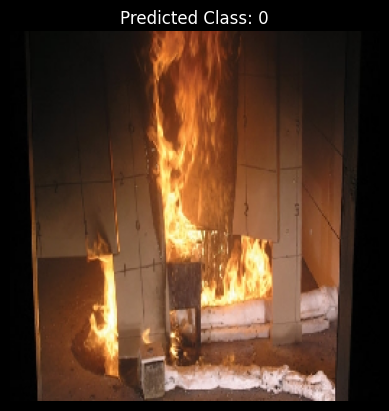

In [ ]:
# PREDICTION FOR ANOTHER SOURCE
image_path = "/content/drive/MyDrive/IBM/Fire-Detection/1/12.jpg"   # Fire
img = image.load_img(image_path,target_size=(256,256))
x = image.img_to_array(img)
x = np.expand_dims(x,axis=0)
Diff_Pred = Model.predict(x)
Diff_Pred = Diff_Pred.argmax(axis=-1)
print(Diff_Pred)

# Visualize the image
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted Class: {Diff_Pred[0]}")
plt.show()

1/1 [==============================] - 0s 158ms/step
[1]


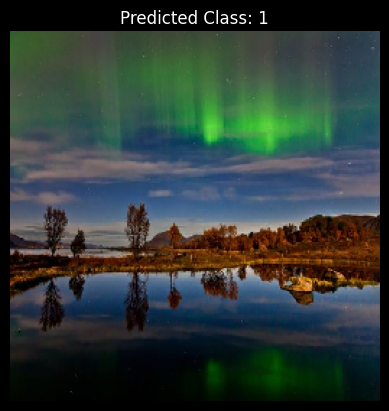

In [ ]:
# PREDICTION FOR ANOTHER SOURCE
image_path = "/content/drive/MyDrive/IBM/Fire-Detection/0/12.jpg"  # Non Fire
img = image.load_img(image_path,target_size=(256,256))
x = image.img_to_array(img)
x = np.expand_dims(x,axis=0)
Diff_Pred = Model.predict(x)
Diff_Pred = Diff_Pred.argmax(axis=-1)
print(Diff_Pred)

# Visualize the image
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted Class: {Diff_Pred[0]}")
plt.show()